<a href="https://colab.research.google.com/github/abdalrahmenyousifMohamed/ML/blob/main/voice_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install kaggle


In [2]:
from google.colab import files

# Upload the kaggle.json file
uploaded = files.upload()


Saving kaggle.json to kaggle.json


In [3]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [4]:
!kaggle datasets download -d kenjee/z-by-hp-unlocked-challenge-3-signal-processing

 99% 600M/604M [00:20<00:00, 28.7MB/s]
100% 604M/604M [00:20<00:00, 30.6MB/s]


In [5]:
!unzip  /content/z-by-hp-unlocked-challenge-3-signal-processing.zip

Archive:  /content/z-by-hp-unlocked-challenge-3-signal-processing.zip
  inflating: Forest Recordings/recording_00.mp3  
  inflating: Forest Recordings/recording_01.mp3  
  inflating: Forest Recordings/recording_02.mp3  
  inflating: Forest Recordings/recording_03.mp3  
  inflating: Forest Recordings/recording_04.mp3  
  inflating: Forest Recordings/recording_05.mp3  
  inflating: Forest Recordings/recording_06.mp3  
  inflating: Forest Recordings/recording_07.mp3  
  inflating: Forest Recordings/recording_08.mp3  
  inflating: Forest Recordings/recording_09.mp3  
  inflating: Forest Recordings/recording_10.mp3  
  inflating: Forest Recordings/recording_11.mp3  
  inflating: Forest Recordings/recording_12.mp3  
  inflating: Forest Recordings/recording_13.mp3  
  inflating: Forest Recordings/recording_14.mp3  
  inflating: Forest Recordings/recording_15.mp3  
  inflating: Forest Recordings/recording_16.mp3  
  inflating: Forest Recordings/recording_17.mp3  
  inflating: Forest Recordings

In [6]:
import os
import random
import glob
import fnmatch
import pandas as pd
import numpy as np
import librosa #To deal with Audio files
import librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd
import math
import tensorflow as tf

In [10]:
import os
import glob

data_path = "/content/z-by-hp-unlocked-challenge-3-signal-processing/"

# Use glob to get full paths of all subdirectories
subdirectory_paths = glob.glob(os.path.join(data_path, "*"))

print(subdirectory_paths)


['/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Parsed_Capuchinbird_Clips', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Parsed_Not_Capuchinbird_Clips']


In [11]:
forest_rec, parsed_Capuchinbird_Clips, Parsed_Not_Capuchinbird_Clips = subdirectory_paths

In [12]:
forest_rec

'/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings'

In [14]:
import os

def get_file_paths(directory_path):
    file_paths = []
    for dirname, _, filenames in os.walk(directory_path):
        for filename in filenames:
            file_paths.append(os.path.join(dirname, filename))
    return file_paths

data_path = "/content/z-by-hp-unlocked-challenge-3-signal-processing/"

forest_paths = get_file_paths(os.path.join(data_path, 'Forest Recordings'))
parsed_Capuchinbird_Clips_paths = get_file_paths(os.path.join(data_path, 'Parsed_Capuchinbird_Clips'))
parsed_Not_Capuchinbird_Clips_paths = get_file_paths(os.path.join(data_path, 'Parsed_Not_Capuchinbird_Clips'))

print("Forest Paths:")
print(forest_paths)

print("Parsed Capuchinbird Clips Paths:")
print(parsed_Capuchinbird_Clips_paths)

print("Parsed Not Capuchinbird Clips Paths:")
print(parsed_Not_Capuchinbird_Clips_paths)


Forest Paths:
['/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_18.mp3', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_32.mp3', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_61.mp3', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_75.mp3', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_36.mp3', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_22.mp3', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_41.mp3', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_86.mp3', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_85.mp3', '/content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_47.mp3', '/content/z-by-hp-unlocked-challenge-3-signal

# EDA and Visualization

In [15]:
def visualize_random_sample(folder_name):
    file_list = os.listdir(folder_name)
    random_sample_index = np.random.randint(0, len(file_list))
    random_sample_file = file_list[random_sample_index]
    sample_address = os.path.join(folder_name, random_sample_file)

    sample_sound, sample_rate = librosa.load(sample_address)
    sample_audio = ipd.Audio(sample_sound, rate=sample_rate)

    return sample_audio

# Usage example
folder_path = forest_rec
sample_audio = visualize_random_sample(folder_path)
sample_audio


 # Loading Data

In [40]:
def load_file_data(folder, file_names, duration=10, sr=22050):
    input_length = sr * duration
    data = []

    for file_name in file_names:
        try:
            sound_file = os.path.join(folder, file_name)
            print("Loading file:", sound_file)
            X, sr = librosa.load(sound_file, sr=sr, duration=duration)
            dur = librosa.get_duration(y=X, sr=sr)

            if round(dur) < duration:
                print("Fixing audio length:", file_name)
                X = librosa.util.fix_length(X, size=input_length)  # Use size keyword argument

            mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sr, n_mfcc=25).T, axis=0)
        except Exception as e:
            print("Error encountered while parsing file:", file_name, e)
            continue

        feature = np.array(mfccs).reshape([-1, 1])
        data.append(feature)

    return data


# Preprocessing
### Encoding

In [41]:
from sklearn.model_selection import train_test_split
from sklearn import preprocessing

# Map label text to integer
Classes = ['Forest', 'Capunchinbird', 'Not_Capunchinbird']
NB_CLASSES = len(Classes)

# Map integer value to text labels
label_to_int = {label: index for index, label in enumerate(Classes)}
print("label_to_int:", label_to_int)

int_to_label = dict(enumerate(Classes))
print("int_to_label:", int_to_label)


label_to_int: {'Forest': 0, 'Capunchinbird': 1, 'Not_Capunchinbird': 2}
int_to_label: {0: 'Forest', 1: 'Capunchinbird', 2: 'Not_Capunchinbird'}


In [42]:
# 22 KHz
SAMPLE_RATE = 22050
# seconds
MAX_SOUND_CLIP_DURATION=10
#, ,

data0_files = fnmatch.filter(os.listdir(forest_rec), '*.*')
data0_sounds = load_file_data(folder=forest_rec,file_names=data0_files, duration=MAX_SOUND_CLIP_DURATION)
data0_labels = [0 for items in data0_files]

data1_files = fnmatch.filter(os.listdir(parsed_Capuchinbird_Clips), '*.*')
data1_sounds = load_file_data(folder=parsed_Capuchinbird_Clips,file_names=data1_files, duration=MAX_SOUND_CLIP_DURATION)
data1_labels = [1 for items in data1_files]

data2_files = fnmatch.filter(os.listdir(Parsed_Not_Capuchinbird_Clips), '*.*')
data2_sounds = load_file_data(folder=Parsed_Not_Capuchinbird_Clips,file_names=data2_files, duration=MAX_SOUND_CLIP_DURATION)
data2_labels = [2 for items in data2_files]

Loading file: /content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_18.mp3
Loading file: /content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_32.mp3
Loading file: /content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_61.mp3
Loading file: /content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_75.mp3
Loading file: /content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_36.mp3
Loading file: /content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_22.mp3
Loading file: /content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_41.mp3
Loading file: /content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_86.mp3
Loading file: /content/z-by-hp-unlocked-challenge-3-signal-processing/Forest Recordings/recording_85.mp3
Loading file: /content/z-by-hp-unlocked-challenge-3-sig

In [43]:
print(np.array(data0_sounds).shape)
print(np.array(data1_sounds).shape)
print(np.array(data2_sounds).shape)

(100, 25, 1)
(217, 25, 1)
(593, 25, 1)


In [44]:
print(data0_files[0:3])
print(data0_labels[0:3])

['recording_18.mp3', 'recording_32.mp3', 'recording_61.mp3']
[0, 0, 0]


In [70]:
import numpy as np
import random

# Concatenate data and labels
X = np.concatenate((data0_sounds, data1_sounds, data2_sounds), axis=0)
Y = np.concatenate((data0_labels, data1_labels, data2_labels), axis=0)

# Shuffle indices
m = len(Y)
M = list(range(m))
random.seed(2021)
random.shuffle(M)

# Split data into training and testing sets
train_ratio = 0.8
train_size = int(m * train_ratio)
train_indices = M[:train_size]
test_indices = M[train_size:]

trainX, trainY = X[train_indices], Y[train_indices]
testX, testY = X[test_indices], Y[test_indices]

# Assign variables for clarity
x_data = trainX
y_data = trainY
test_x = testX
test_y = testY


In [63]:
# split data into Train, Validation and Test
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, train_size=0.8, random_state=42, shuffle=True)
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, train_size=0.8, random_state=42, shuffle=True)

In [64]:
print(y_train.shape,y_test.shape,y_val.shape,test_y.shape)

(465,) (146,) (117,) (182,)


In [86]:
# One-Hot encoding for classes
y_train = np.array(tf.keras.utils.to_categorical(y_train,len(Classes)))
y_test = np.array(tf.keras.utils.to_categorical(y_test,len(Classes)))
y_val = np.array(tf.keras.utils.to_categorical(y_val,len(Classes)))
test_y = np.array(tf.keras.utils.to_categorical(test_y,len(Classes)))

In [66]:
y_train.shape , y_test.shape , y_val.shape , test_y.shape

((465, 3), (146, 3), (117, 3), (182, 3))

In [67]:
#Correct imbalnced data using class weight

TRAIN_IMG_COUNT = 100
COUNT_0 = 10
COUNT_1 = 10
COUNT_2 = 10
weight_for_0 = TRAIN_IMG_COUNT / (2 * COUNT_0)
weight_for_1 = TRAIN_IMG_COUNT / (2 * COUNT_1)
weight_for_2 = TRAIN_IMG_COUNT / (2 * COUNT_2)
class_weight = {0: weight_for_0, 1: weight_for_1, 2: weight_for_1,}
class_weight

{0: 5.0, 1: 5.0, 2: 5.0}

In [68]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, LSTM, Bidirectional, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau, ModelCheckpoint,TensorBoard,ProgbarLogger
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping
from tensorflow.keras.regularizers import l2
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
model = Sequential()

model.add(Bidirectional(LSTM(128, dropout=0.05, recurrent_dropout=0.20, return_sequences=True), input_shape = (25,1)))
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(128,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Dense(64,activation='relu'))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.compile(loss='categorical_crossentropy', optimizer=Adam(1e-4), metrics=['acc'])

model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirectio  (None, 25, 256)          133120    
 nal)                                                            
                                                                 
 dense_10 (Dense)            (None, 25, 128)           32896     
                                                                 
 dropout_2 (Dropout)         (None, 25, 128)           0         
                                                                 
 dense_11 (Dense)            (None, 25, 128)           16512     
                                                                 
 dense_12 (Dense)            (None, 25, 64)            8256      
                                                                 
 dense_13 (Dense)            (None, 25, 64)            4160      
                                                      

In [69]:
x_train.shape , y_train.shape

((465, 25, 1), (465, 3))

In [71]:
weight_saver = ModelCheckpoint('set_a_weights.h5', monitor='val_loss',
                               save_best_only=True, save_weights_only=True)
annealer = LearningRateScheduler(lambda x: 1e-3 * 0.8**x)
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)
history=model.fit(x_train, y_train,
                  batch_size=3,
                  epochs=30,
                  callbacks=[weight_saver, annealer],
                  validation_data=(x_val, y_val))

Epoch 1/30
155/155 [==============================] - 28s 113ms/step - loss: 0.5893 - acc: 0.7634 - val_loss: 0.2238 - val_acc: 0.9487 - lr: 0.0010
Epoch 2/30
155/155 [==============================] - 15s 99ms/step - loss: 0.1879 - acc: 0.9548 - val_loss: 0.1810 - val_acc: 0.9402 - lr: 8.0000e-04
Epoch 3/30
155/155 [==============================] - 24s 157ms/step - loss: 0.0897 - acc: 0.9785 - val_loss: 0.1548 - val_acc: 0.9487 - lr: 6.4000e-04
Epoch 4/30
155/155 [==============================] - 16s 105ms/step - loss: 0.0669 - acc: 0.9785 - val_loss: 0.0634 - val_acc: 0.9744 - lr: 5.1200e-04
Epoch 5/30
155/155 [==============================] - 16s 103ms/step - loss: 0.0569 - acc: 0.9806 - val_loss: 0.0627 - val_acc: 0.9744 - lr: 4.0960e-04
Epoch 6/30
155/155 [==============================] - 15s 98ms/step - loss: 0.0497 - acc: 0.9763 - val_loss: 0.0534 - val_acc: 0.9744 - lr: 3.2768e-04
Epoch 7/30
155/155 [==============================] - 16s 104ms/step - loss: 0.0159 - acc: 0.9

<Axes: >

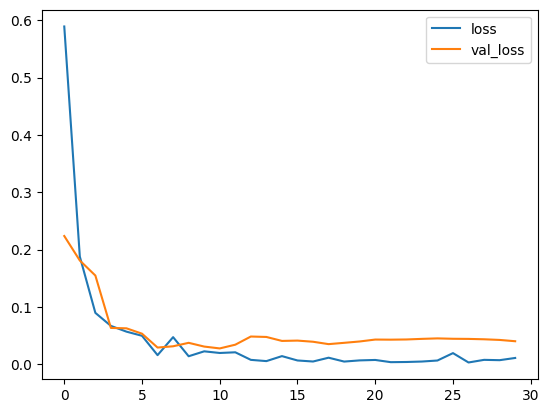

In [72]:
losses = pd.DataFrame(model.history.history)
losses[['loss','val_loss']].plot()

<Axes: >

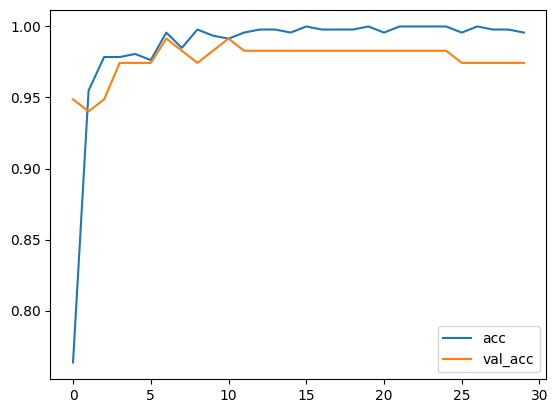

In [73]:
losses[['acc','val_acc']].plot()

In [87]:
test_y.shape

(182, 3)

In [88]:
# make a prediction
y_pred = model.predict(test_x, batch_size=5)
#check scores
scores = model.evaluate(test_x, test_y)
print ("Model evaluation accuracy: ", round(scores[1]*100),"%")

6/6 [==============================] - 0s 25ms/step - loss: 0.0909 - acc: 0.9780
Model evaluation accuracy:  98 %


In [75]:
model.save('heart_sounds.h5')
# prediction class
y_pred = np.asarray(model.predict(x_test, batch_size=32))
y_pred = np.argmax(y_pred,axis=1)
print ("prediction test return :",y_pred[1], "-", int_to_label[y_pred[1]])

5/5 [==============================] - 0s 22ms/step
prediction test return : 1 - Capunchinbird


In [76]:
def preprocessing (file_path, duration=10, sr=22050):
    input_length=sr*duration
    process_file=[]
    X, sr = librosa.load(file_path, sr=sr, duration=duration)
    dur = librosa.get_duration(y=X, sr=sr)
    # pad audio file same duration
    if (round(dur) < duration):
        y = librosa.util.fix_length(X, input_length)
        mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sr, n_mfcc=40, n_fft=512,hop_length=2048).T,axis=0)
        feature = np.array(mfccs).reshape([-1,1])
        process_file.append(feature)
        process_file_array = np.asarray(process_file)
    return process_file_array

In [77]:
####
y_pred = np.asarray(model.predict(x_test, batch_size=32))
PRED = y_pred.argmax(axis=1)
TRUE = y_test.argmax(axis=1)

target_names = ['Forest','Capuchinbird','Not_Capuchinbird']
print(classification_report(TRUE, PRED, target_names=target_names, digits=4))

5/5 [==============================] - 0s 20ms/step
                  precision    recall  f1-score   support

          Forest     1.0000    0.8000    0.8889        15
    Capuchinbird     0.9474    1.0000    0.9730        36
Not_Capuchinbird     0.9792    0.9895    0.9843        95

        accuracy                         0.9726       146
       macro avg     0.9755    0.9298    0.9487       146
    weighted avg     0.9735    0.9726    0.9717       146

